# Horse2Zebra

Loading data from: /kaggle/input/horse2zebra/horse2zebra
Train images: 1334
Test images: 140


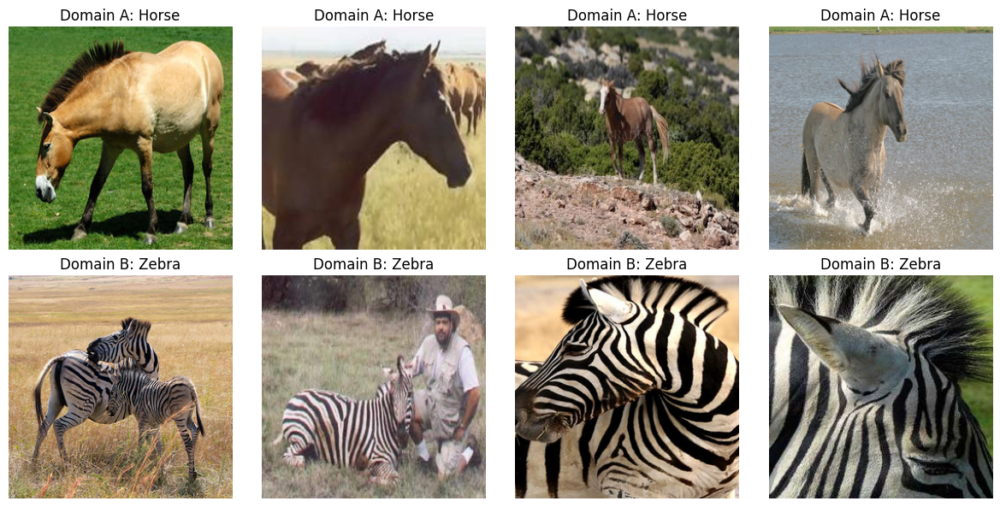

In [1]:
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import glob
import os
import random
from pathlib import Path

DATASET_PATH=Path("/kaggle/input/horse2zebra/horse2zebra")
BATCH_SIZE = 4 
IMAGE_SIZE = 256

class HorseZebraDataset(Dataset):
    def __init__(self, root, transforms_=None, mode='train'):

        self.transform = transforms.Compose(transforms_)
        
        self.files_A = sorted(glob.glob(os.path.join(root, f'{mode}A') + '/*.*'))
        self.files_B = sorted(glob.glob(os.path.join(root, f'{mode}B') + '/*.*'))
        
        if len(self.files_A) == 0 or len(self.files_B) == 0:
            print(f"Warning: No images found in {root}/{mode}A or {root}/{mode}B. Check path.")

    def __getitem__(self, index):
        img_A = Image.open(self.files_A[index % len(self.files_A)]).convert("RGB")
        index_B = random.randint(0, len(self.files_B) - 1)
        img_B = Image.open(self.files_B[index_B]).convert("RGB")

        item_A = self.transform(img_A)
        item_B = self.transform(img_B)

        return {'A': item_A, 'B': item_B}

    def __len__(self):
        return max(len(self.files_A), len(self.files_B))

transforms_ = [
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE), Image.BICUBIC),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
]

print(f"Loading data from: {DATASET_PATH}")

train_dataset = HorseZebraDataset(DATASET_PATH, transforms_=transforms_, mode='train')
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)

test_dataset = HorseZebraDataset(DATASET_PATH, transforms_=transforms_, mode='test')
test_loader = DataLoader(test_dataset, batch_size=5, shuffle=False, num_workers=1)

print(f"Train images: {len(train_dataset)}")
print(f"Test images: {len(test_dataset)}")

def show_sample_batch(dataloader, n_samples=4):
    batch = next(iter(dataloader))
    real_A = batch['A'][:n_samples] 
    real_B = batch['B'][:n_samples] 
    
    plt.figure(figsize=(12, 6))
    
    for i in range(n_samples):
        plt.subplot(2, n_samples, i + 1)
        img_a = real_A[i].permute(1, 2, 0).numpy() * 0.5 + 0.5
        plt.imshow(img_a)
        plt.title("Domain A: Horse")
        plt.axis('off')
        
        plt.subplot(2, n_samples, i + 1 + n_samples)
        img_b = real_B[i].permute(1, 2, 0).numpy() * 0.5 + 0.5
        plt.imshow(img_b)
        plt.title("Domain B: Zebra")
        plt.axis('off')
        
    plt.tight_layout()
    plt.show()


show_sample_batch(train_loader, n_samples=4)


In [2]:
import torch
import torch.nn as nn

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(channels, channels, kernel_size=3),
            nn.InstanceNorm2d(channels),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(channels, channels, kernel_size=3),
            nn.InstanceNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x) 

class Generator(nn.Module):
    def __init__(self, input_shape, num_residual_blocks=6):

        super(Generator, self).__init__()
        channels = input_shape[0]

        model = [
            nn.ReflectionPad2d(3),
            nn.Conv2d(channels, 64, kernel_size=7),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        ]

        in_features = 64
        out_features = in_features * 2
        for _ in range(2):
            model += [
                nn.Conv2d(in_features, out_features, kernel_size=3, stride=2, padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True)
            ]
            in_features = out_features
            out_features = in_features * 2


        for _ in range(num_residual_blocks):
            model += [ResidualBlock(in_features)]

        out_features = in_features // 2
        for _ in range(2):
            model += [
                nn.ConvTranspose2d(in_features, out_features, kernel_size=3, stride=2, padding=1, output_padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True)
            ]
            in_features = out_features
            out_features = in_features // 2

        model += [
            nn.ReflectionPad2d(3),
            nn.Conv2d(64, channels, kernel_size=7),
            nn.Tanh()
        ]

        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)

class Discriminator(nn.Module):
    def __init__(self, input_shape):

        super(Discriminator, self).__init__()
        channels, height, width = input_shape

        def discriminator_block(in_filters, out_filters, normalize=True):
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]
            if normalize:
                layers.append(nn.InstanceNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *discriminator_block(channels, 64, normalize=False),

            *discriminator_block(64, 128),

            *discriminator_block(128, 256),

            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(256, 512, 4, padding=1),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(512, 1, 4, padding=1)
        )

    def forward(self, img):
        return self.model(img)

if __name__ == "__main__":
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Running on Device: {device}")

    img_shape = (3, 128, 128)
    
    G = Generator(img_shape, num_residual_blocks=6).to(device)
    D = Discriminator(img_shape).to(device)

    from torchsummary import summary
    print("\n" + "="*50)
    print("GENERATOR SUMMARY")
    print("="*50)
    summary(G, img_shape)
        
    print("\n" + "="*50)
    print("DISCRIMINATOR SUMMARY")
    print("="*50)
    summary(D, img_shape)
        

    def count_parameters(model):
        return sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f"\nGenerator Trainable Params: {count_parameters(G):,}")
    print(f"Discriminator Trainable Params: {count_parameters(D):,}")

    x = torch.randn(1, 3, 128, 128).to(device)
    fake_x = G(x)
    validity = D(x)
    
    print("\n--- Shape Verification ---")
    print(f"Generator Output Shape:     {fake_x.shape}") 
    print(f"Discriminator Output Shape: {validity.shape}")

Running on Device: cuda

GENERATOR SUMMARY
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ReflectionPad2d-1          [-1, 3, 134, 134]               0
            Conv2d-2         [-1, 64, 128, 128]           9,472
    InstanceNorm2d-3         [-1, 64, 128, 128]               0
              ReLU-4         [-1, 64, 128, 128]               0
            Conv2d-5          [-1, 128, 64, 64]          73,856
    InstanceNorm2d-6          [-1, 128, 64, 64]               0
              ReLU-7          [-1, 128, 64, 64]               0
            Conv2d-8          [-1, 256, 32, 32]         295,168
    InstanceNorm2d-9          [-1, 256, 32, 32]               0
             ReLU-10          [-1, 256, 32, 32]               0
  ReflectionPad2d-11          [-1, 256, 34, 34]               0
           Conv2d-12          [-1, 256, 32, 32]         590,080
   InstanceNorm2d-13          [-1, 256, 32, 32]             

Device set to: cuda
Starting Training for 20 Epochs...


Epoch 1: G_A: 0.4041 | G_B: 0.4166 | D_A: 0.3235 | D_B: 0.3066 | Cycle: 2.7772


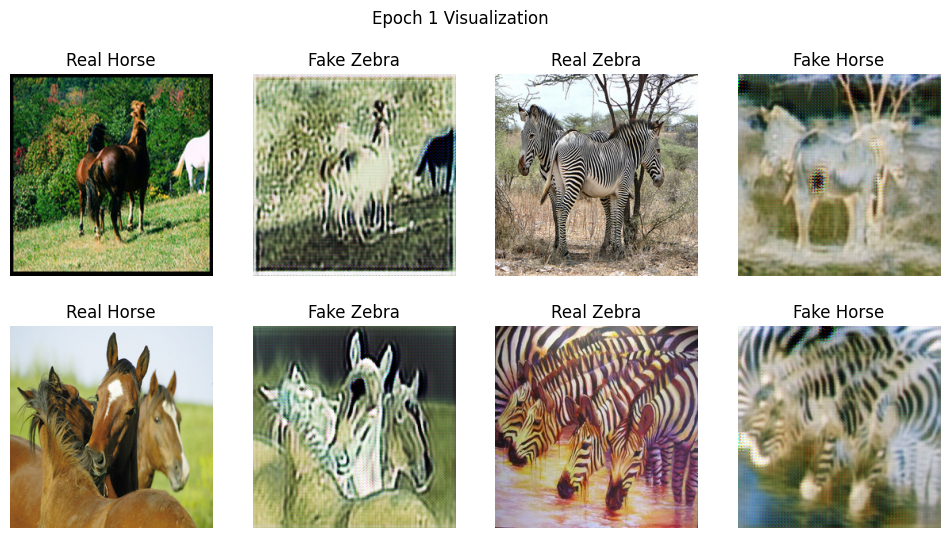

Epoch 2: G_A: 0.4188 | G_B: 0.3838 | D_A: 0.2456 | D_B: 0.2102 | Cycle: 2.3557


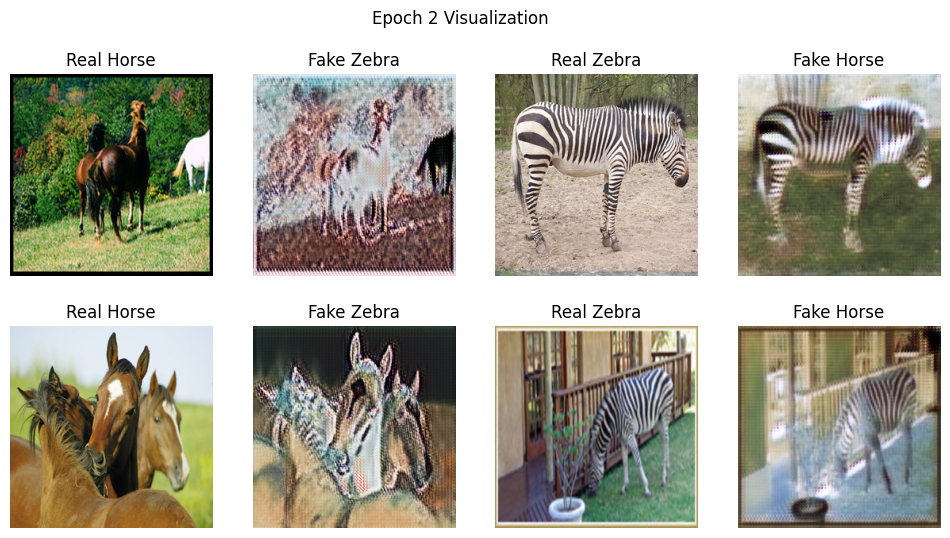

Epoch 3: G_A: 0.4088 | G_B: 0.4001 | D_A: 0.2116 | D_B: 0.1979 | Cycle: 2.1363


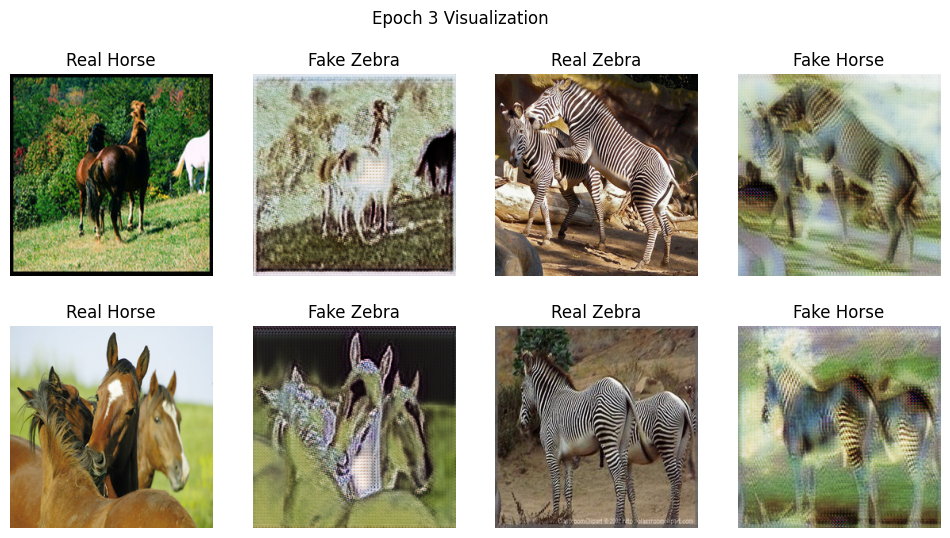

Epoch 4: G_A: 0.4180 | G_B: 0.3633 | D_A: 0.2076 | D_B: 0.1900 | Cycle: 2.0184


Epoch 5: G_A: 0.4524 | G_B: 0.3688 | D_A: 0.2072 | D_B: 0.1864 | Cycle: 1.9338


Epoch 6: G_A: 0.4648 | G_B: 0.3688 | D_A: 0.2067 | D_B: 0.1811 | Cycle: 1.8790


Epoch 7: G_A: 0.4788 | G_B: 0.3848 | D_A: 0.1997 | D_B: 0.1766 | Cycle: 1.8455


Epoch 8: G_A: 0.4773 | G_B: 0.4158 | D_A: 0.1943 | D_B: 0.1710 | Cycle: 1.8200


Epoch 9: G_A: 0.4607 | G_B: 0.4003 | D_A: 0.1975 | D_B: 0.1729 | Cycle: 1.7818


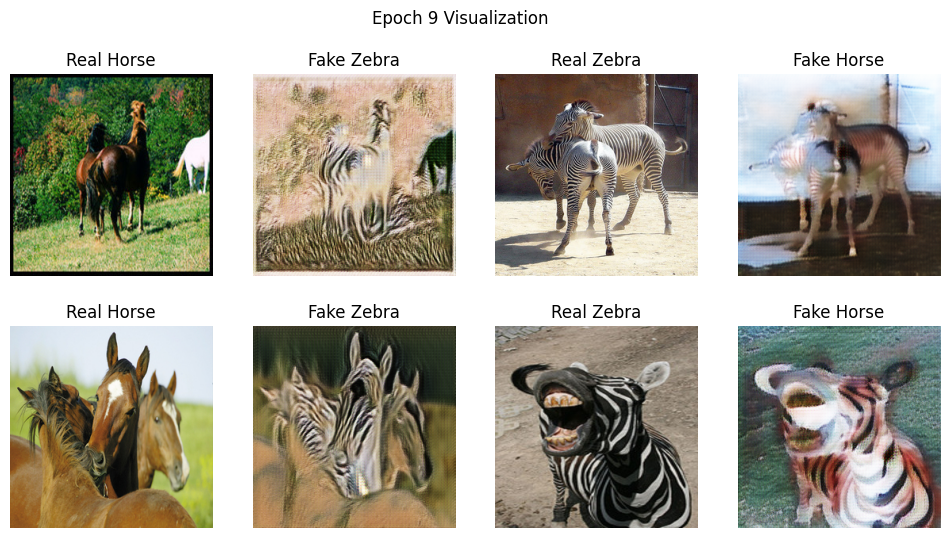

Epoch 10: G_A: 0.4564 | G_B: 0.4038 | D_A: 0.1953 | D_B: 0.1758 | Cycle: 1.7386


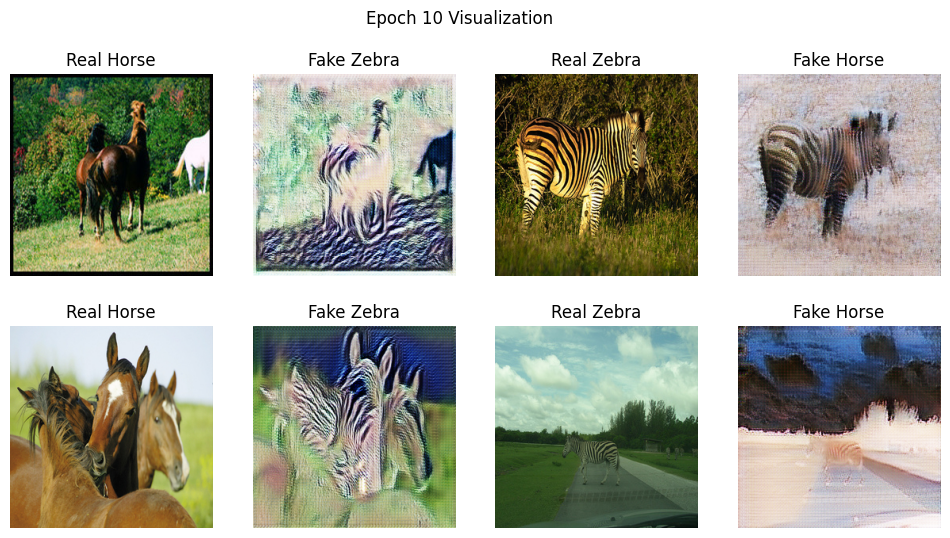

Epoch 11: G_A: 0.4777 | G_B: 0.3951 | D_A: 0.1971 | D_B: 0.1741 | Cycle: 1.7304


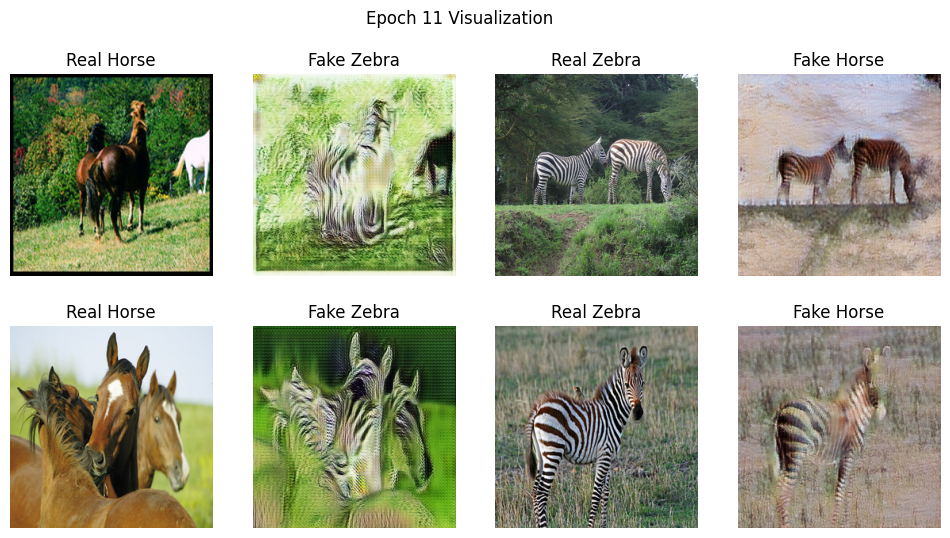

Epoch 12: G_A: 0.4963 | G_B: 0.3909 | D_A: 0.1926 | D_B: 0.1634 | Cycle: 1.7035


Epoch 13: G_A: 0.4803 | G_B: 0.3935 | D_A: 0.1945 | D_B: 0.1674 | Cycle: 1.6655


Epoch 14: G_A: 0.4756 | G_B: 0.3981 | D_A: 0.1917 | D_B: 0.1636 | Cycle: 1.6438


Epoch 15: G_A: 0.4866 | G_B: 0.3988 | D_A: 0.1917 | D_B: 0.1603 | Cycle: 1.6439


Epoch 16: G_A: 0.4909 | G_B: 0.4104 | D_A: 0.1829 | D_B: 0.1565 | Cycle: 1.6351


Epoch 17: G_A: 0.5020 | G_B: 0.4085 | D_A: 0.1881 | D_B: 0.1568 | Cycle: 1.5941


Epoch 18: G_A: 0.5033 | G_B: 0.4253 | D_A: 0.1801 | D_B: 0.1561 | Cycle: 1.5921


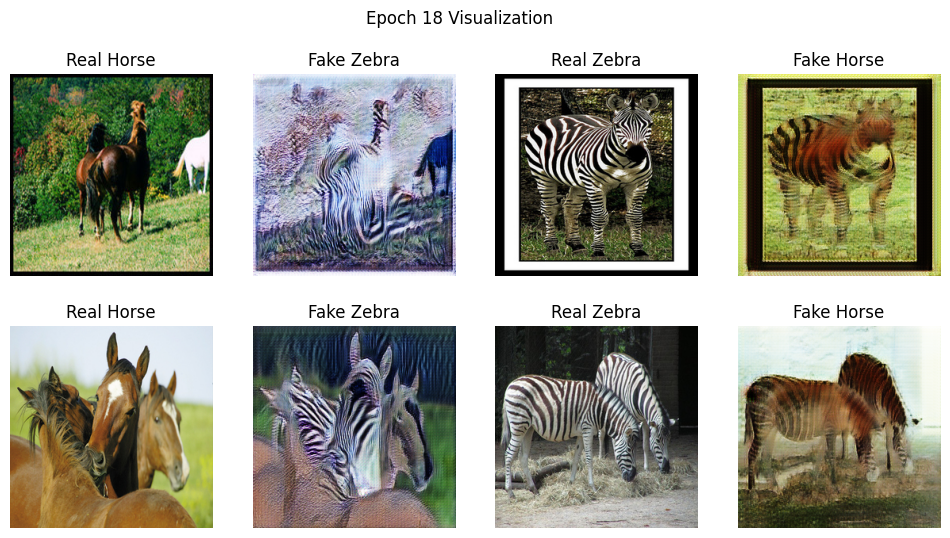

Epoch 19: G_A: 0.5082 | G_B: 0.4138 | D_A: 0.1844 | D_B: 0.1512 | Cycle: 1.5659


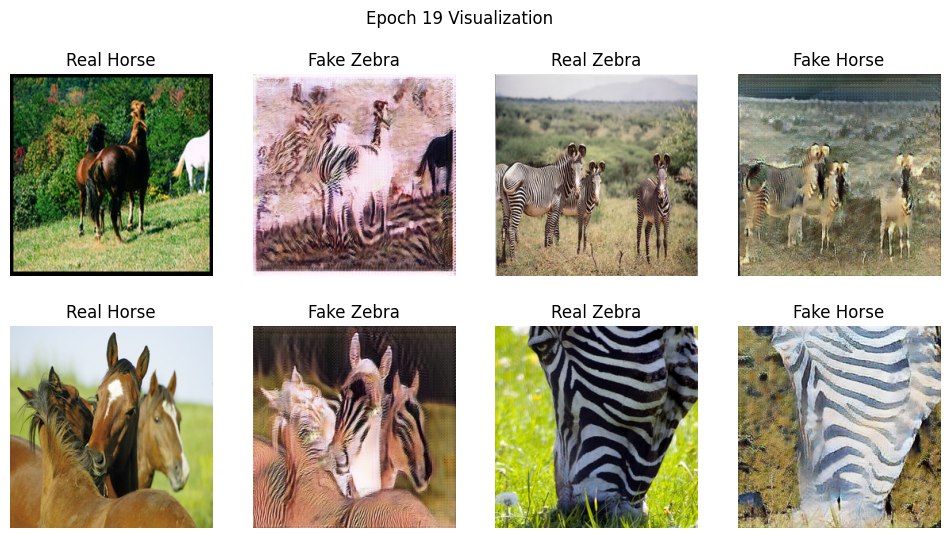

Epoch 20: G_A: 0.5131 | G_B: 0.4089 | D_A: 0.1801 | D_B: 0.1489 | Cycle: 1.5441


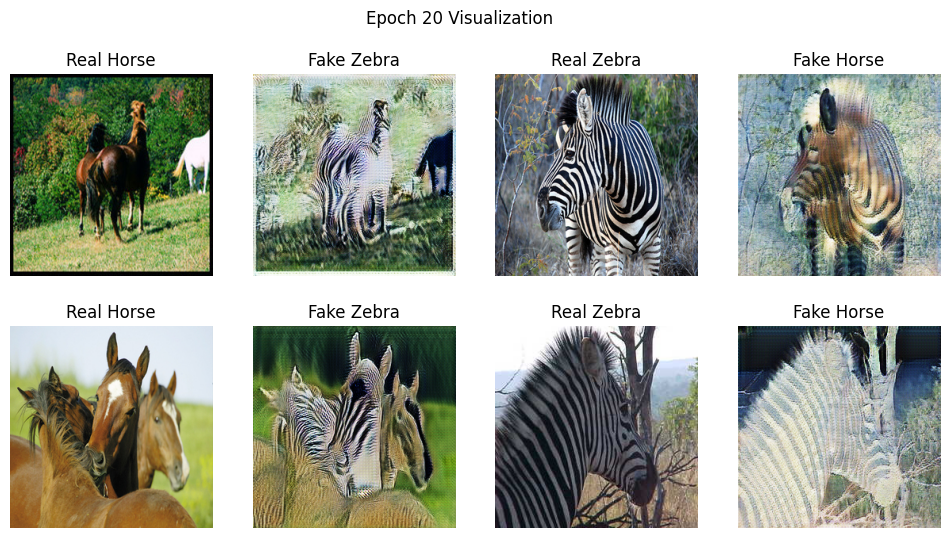

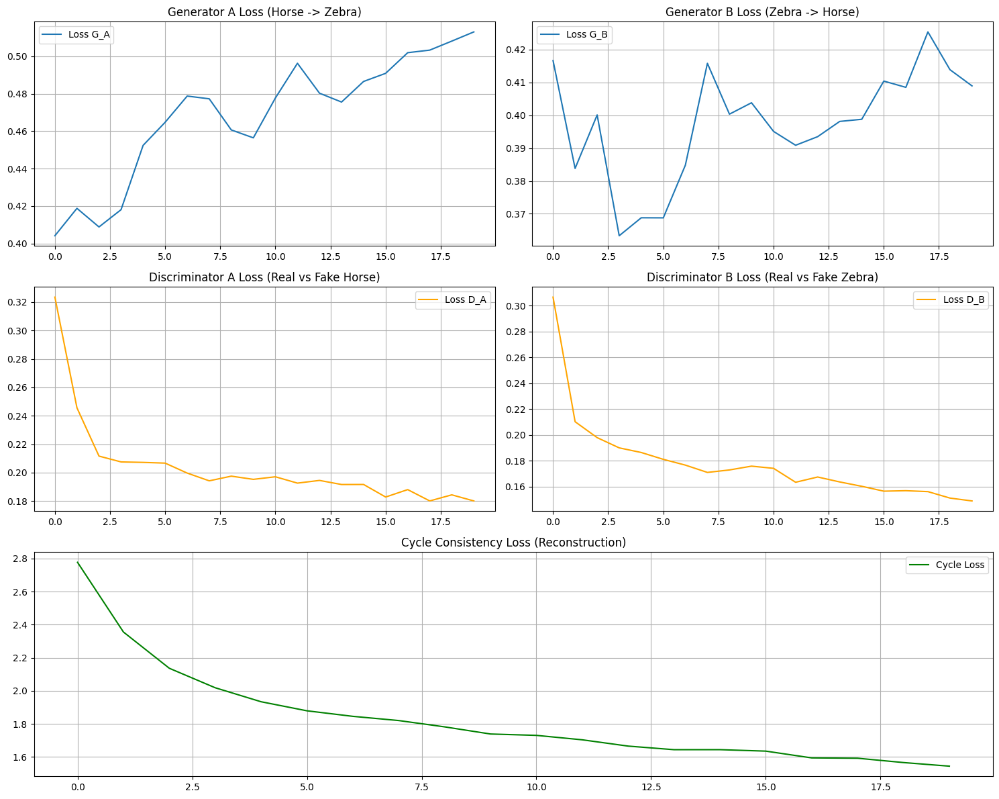

In [3]:
import torch
import itertools
import random
import numpy as np
import matplotlib.pyplot as plt
from torch.autograd import Variable
from torch.utils.data import DataLoader
from tqdm import tqdm
import gc
from torch.amp import autocast, GradScaler 

gc.collect()
torch.cuda.empty_cache()

class ReplayBuffer:
    def __init__(self, max_size=50):
        self.max_size = max_size
        self.data = []

    def push_and_pop(self, data):
        to_return = []
        for element in data.data:
            element = torch.unsqueeze(element, 0)
            if len(self.data) < self.max_size:
                self.data.append(element)
                to_return.append(element)
            else:
                if random.uniform(0, 1) > 0.5:
                    i = random.randint(0, self.max_size - 1)
                    to_return.append(self.data[i].clone())
                    self.data[i] = element
                else:
                    to_return.append(element)
        return torch.cat(to_return)

def weights_init_normal(m):
    classname = m.__class__.__name__
    if 'Conv' in classname:
        if m.weight is not None:
            torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
        if hasattr(m, 'bias') and m.bias is not None:
            torch.nn.init.constant_(m.bias.data, 0.0)
    elif 'BatchNorm2d' in classname or 'InstanceNorm2d' in classname:
        if m.weight is not None:
            torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        if m.bias is not None:
            torch.nn.init.constant_(m.bias.data, 0.0)

EPOCHS = 20
BATCH_SIZE =1        
LR = 0.0002           
B1 = 0.5              
B2 = 0.999
LAMBDA_CYC = 10.0     
LAMBDA_ID = 0.0       
HEIGHT, WIDTH = 128, 128

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device set to: {DEVICE}")


train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=5, shuffle=False, num_workers=1)

G_AB = Generator((3, HEIGHT, WIDTH)).to(DEVICE)
G_BA = Generator((3, HEIGHT, WIDTH)).to(DEVICE)
D_A = Discriminator((3, HEIGHT, WIDTH)).to(DEVICE)
D_B = Discriminator((3, HEIGHT, WIDTH)).to(DEVICE)

G_AB.apply(weights_init_normal)
G_BA.apply(weights_init_normal)
D_A.apply(weights_init_normal)
D_B.apply(weights_init_normal)

optimizer_G = torch.optim.Adam(
    itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=LR, betas=(B1, B2)
)
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=LR, betas=(B1, B2))
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=LR, betas=(B1, B2))

criterion_GAN = torch.nn.MSELoss()
criterion_cycle = torch.nn.L1Loss()
criterion_identity = torch.nn.L1Loss()

fake_A_buffer = ReplayBuffer()
fake_B_buffer = ReplayBuffer()

scaler = GradScaler('cuda')

loss_history = {'G_A': [], 'G_B': [], 'D_A': [], 'D_B': [], 'cycle': []}

def sample_images(epoch):
    batch = next(iter(test_loader))
    real_A = batch['A'].to(DEVICE) 
    real_B = batch['B'].to(DEVICE) 
    
    G_AB.eval()
    G_BA.eval()
    
    with torch.no_grad():
        fake_B = G_AB(real_A[:2]) 
        fake_A = G_BA(real_B[:2]) 
    

    def to_img(t): 
        img = t.cpu().detach().permute(1, 2, 0).numpy() * 0.5 + 0.5
        return np.clip(img, 0, 1)
    
    fig, axs = plt.subplots(2, 4, figsize=(12, 6))

    titles = ['Real Horse', 'Fake Zebra', 'Real Zebra', 'Fake Horse']
    
    for i in range(2):
        axs[i, 0].imshow(to_img(real_A[i])); axs[i, 0].set_title(titles[0]); axs[i, 0].axis('off')
        axs[i, 1].imshow(to_img(fake_B[i])); axs[i, 1].set_title(titles[1]); axs[i, 1].axis('off')
        
        axs[i, 2].imshow(to_img(real_B[i])); axs[i, 2].set_title(titles[2]); axs[i, 2].axis('off')
        axs[i, 3].imshow(to_img(fake_A[i])); axs[i, 3].set_title(titles[3]); axs[i, 3].axis('off')
        
    plt.suptitle(f"Epoch {epoch} Visualization")
    plt.show()
    
    G_AB.train()
    G_BA.train()

print(f"Starting Training for {EPOCHS} Epochs...")

for epoch in range(1, EPOCHS + 1):
    
    epoch_losses = {'G_A': 0, 'G_B': 0, 'D_A': 0, 'D_B': 0, 'cycle': 0}
    num_batches = len(train_loader)
    
    loop = tqdm(train_loader, desc=f"Epoch {epoch}", leave=False)
    
    for i, batch in enumerate(loop):
        
        real_A = batch['A'].to(DEVICE)
        real_B = batch['B'].to(DEVICE)
        
        with torch.no_grad():
            dummy_out = D_A(real_A)
            target_real = Variable(torch.ones_like(dummy_out).to(DEVICE), requires_grad=False)
            target_fake = Variable(torch.zeros_like(dummy_out).to(DEVICE), requires_grad=False)


        optimizer_G.zero_grad()

        with autocast('cuda'):
            
            loss_id_A = criterion_identity(G_BA(real_A), real_A)
            loss_id_B = criterion_identity(G_AB(real_B), real_B)
            loss_identity = (loss_id_A + loss_id_B) / 2 * LAMBDA_ID

            fake_B = G_AB(real_A)
            loss_GAN_AB = criterion_GAN(D_B(fake_B), target_real)
            fake_A = G_BA(real_B)
            loss_GAN_BA = criterion_GAN(D_A(fake_A), target_real)
            loss_GAN = (loss_GAN_AB + loss_GAN_BA) / 2

            recov_A = G_BA(fake_B)
            loss_cycle_A = criterion_cycle(recov_A, real_A)
            recov_B = G_AB(fake_A)
            loss_cycle_B = criterion_cycle(recov_B, real_B)
            loss_cycle = (loss_cycle_A + loss_cycle_B) / 2 * LAMBDA_CYC

            loss_G = loss_GAN + loss_cycle + loss_identity

        scaler.scale(loss_G).backward()
        scaler.step(optimizer_G)


        optimizer_D_A.zero_grad()
        with autocast('cuda'):
            loss_real = criterion_GAN(D_A(real_A), target_real)
            fake_A_ = fake_A_buffer.push_and_pop(fake_A)
            loss_fake = criterion_GAN(D_A(fake_A_.detach()), target_fake)
            loss_D_A = (loss_real + loss_fake) / 2
        scaler.scale(loss_D_A).backward()
        scaler.step(optimizer_D_A)


        optimizer_D_B.zero_grad()
        with autocast('cuda'):
            loss_real = criterion_GAN(D_B(real_B), target_real)
            fake_B_ = fake_B_buffer.push_and_pop(fake_B)
            loss_fake = criterion_GAN(D_B(fake_B_.detach()), target_fake)
            loss_D_B = (loss_real + loss_fake) / 2
        scaler.scale(loss_D_B).backward()
        scaler.step(optimizer_D_B)
        
        scaler.update()
        
        epoch_losses['G_A'] += loss_GAN_AB.item()
        epoch_losses['G_B'] += loss_GAN_BA.item()
        epoch_losses['D_A'] += loss_D_A.item()
        epoch_losses['D_B'] += loss_D_B.item()
        epoch_losses['cycle'] += loss_cycle.item()

    for key in epoch_losses:
        loss_history[key].append(epoch_losses[key] / num_batches)

    print(f"Epoch {epoch}: "
          f"G_A: {loss_history['G_A'][-1]:.4f} | "
          f"G_B: {loss_history['G_B'][-1]:.4f} | "
          f"D_A: {loss_history['D_A'][-1]:.4f} | "
          f"D_B: {loss_history['D_B'][-1]:.4f} | "
          f"Cycle: {loss_history['cycle'][-1]:.4f}")

    if epoch <= 3 or 9 <= epoch <= 11 or epoch >= 18:
        sample_images(epoch)

plt.figure(figsize=(15, 12))

plt.subplot(3, 2, 1)
plt.plot(loss_history['G_A'], label='Loss G_A')
plt.title("Generator A Loss (Horse -> Zebra)")
plt.legend()
plt.grid(True)

plt.subplot(3, 2, 2)
plt.plot(loss_history['G_B'], label='Loss G_B')
plt.title("Generator B Loss (Zebra -> Horse)")
plt.legend()
plt.grid(True)

plt.subplot(3, 2, 3)
plt.plot(loss_history['D_A'], label='Loss D_A', color='orange')
plt.title("Discriminator A Loss (Real vs Fake Horse)")
plt.legend()
plt.grid(True)

plt.subplot(3, 2, 4)
plt.plot(loss_history['D_B'], label='Loss D_B', color='orange')
plt.title("Discriminator B Loss (Real vs Fake Zebra)")
plt.legend()
plt.grid(True)

plt.subplot(3, 1, 3)
plt.plot(loss_history['cycle'], label='Cycle Loss', color='green')
plt.title("Cycle Consistency Loss (Reconstruction)")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Apple2Orange

Loading data from: /kaggle/input/apple2orange/apple2orange
Train images: 1019
Test images: 266


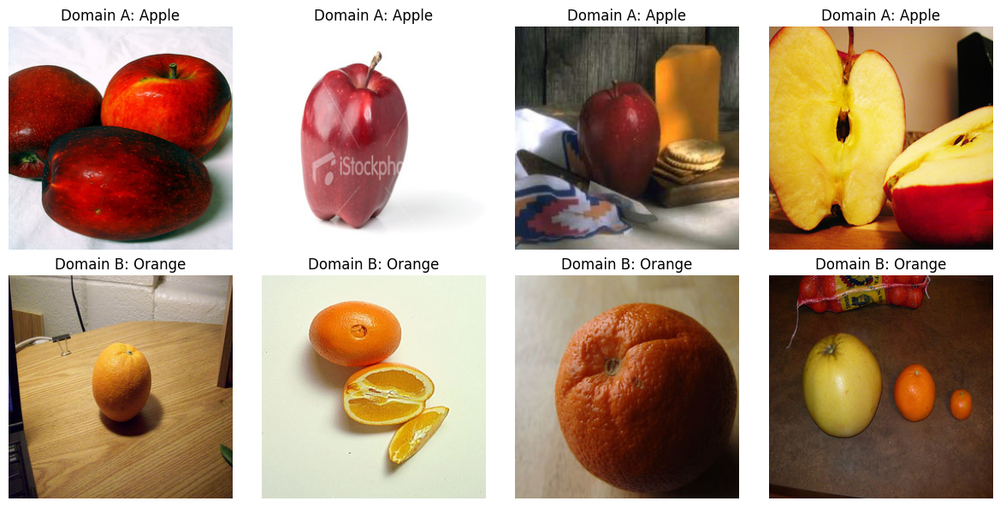

In [4]:
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import glob
import os
import random
from pathlib import Path

DATASET_PATH2 = Path("/kaggle/input/apple2orange/apple2orange")
BATCH_SIZE = 4 
IMAGE_SIZE = 256 

class HorseZebraDataset(Dataset):
    def __init__(self, root, transforms_=None, mode='train'):
       
        self.transform = transforms.Compose(transforms_)
        
        self.files_A = sorted(glob.glob(os.path.join(root, f'{mode}A') + '/*.*'))
        self.files_B = sorted(glob.glob(os.path.join(root, f'{mode}B') + '/*.*'))
        
        if len(self.files_A) == 0 or len(self.files_B) == 0:
            print(f"Warning: No images found in {root}/{mode}A or {root}/{mode}B. Check path.")

    def __getitem__(self, index):
        img_A = Image.open(self.files_A[index % len(self.files_A)]).convert("RGB")
        index_B = random.randint(0, len(self.files_B) - 1)
        img_B = Image.open(self.files_B[index_B]).convert("RGB")

        item_A = self.transform(img_A)
        item_B = self.transform(img_B)

        return {'A': item_A, 'B': item_B}

    def __len__(self):
        return max(len(self.files_A), len(self.files_B))

transforms_ = [
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE), Image.BICUBIC),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
]

print(f"Loading data from: {DATASET_PATH2}")

train_dataset = HorseZebraDataset(DATASET_PATH2, transforms_=transforms_, mode='train')
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)

test_dataset = HorseZebraDataset(DATASET_PATH2, transforms_=transforms_, mode='test')
test_loader = DataLoader(test_dataset, batch_size=5, shuffle=False, num_workers=1)

print(f"Train images: {len(train_dataset)}")
print(f"Test images: {len(test_dataset)}")

def show_sample_batch(dataloader, n_samples=4):
    batch = next(iter(dataloader))
    real_A = batch['A'][:n_samples] 
    real_B = batch['B'][:n_samples] 
    
    plt.figure(figsize=(12, 6))
    
    for i in range(n_samples):
        plt.subplot(2, n_samples, i + 1)
        img_a = real_A[i].permute(1, 2, 0).numpy() * 0.5 + 0.5
        plt.imshow(img_a)
        plt.title("Domain A: Apple")
        plt.axis('off')
        
        plt.subplot(2, n_samples, i + 1 + n_samples)
        img_b = real_B[i].permute(1, 2, 0).numpy() * 0.5 + 0.5
        plt.imshow(img_b)
        plt.title("Domain B: Orange")
        plt.axis('off')
        
    plt.tight_layout()
    plt.show()

    
show_sample_batch(train_loader, n_samples=4)


In [5]:
import torch
import torch.nn as nn

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.ReflectionPad2d(1), 
            nn.Conv2d(channels, channels, kernel_size=3),
            nn.InstanceNorm2d(channels),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(channels, channels, kernel_size=3),
            nn.InstanceNorm2d(channels)
        )

    def forward(self, x):
        return x + self.block(x) 

class Generator(nn.Module):
    def __init__(self, input_shape, num_residual_blocks=6):

        super(Generator, self).__init__()
        channels = input_shape[0] 

        model = [
            nn.ReflectionPad2d(3),
            nn.Conv2d(channels, 64, kernel_size=7),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        ]

        in_features = 64
        out_features = in_features * 2
        for _ in range(2):
            model += [
                nn.Conv2d(in_features, out_features, kernel_size=3, stride=2, padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True)
            ]
            in_features = out_features
            out_features = in_features * 2


        for _ in range(num_residual_blocks):
            model += [ResidualBlock(in_features)]

        out_features = in_features // 2
        for _ in range(2):
            model += [
                nn.ConvTranspose2d(in_features, out_features, kernel_size=3, stride=2, padding=1, output_padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True)
            ]
            in_features = out_features
            out_features = in_features // 2

        model += [
            nn.ReflectionPad2d(3),
            nn.Conv2d(64, channels, kernel_size=7),
            nn.Tanh() 
        ]

        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)

class Discriminator(nn.Module):
    def __init__(self, input_shape):

        super(Discriminator, self).__init__()
        channels, height, width = input_shape

        def discriminator_block(in_filters, out_filters, normalize=True):
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]
            if normalize:
                layers.append(nn.InstanceNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *discriminator_block(channels, 64, normalize=False),

            *discriminator_block(64, 128),

            *discriminator_block(128, 256),

            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(256, 512, 4, padding=1),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(512, 1, 4, padding=1)
        )

    def forward(self, img):
        return self.model(img)

if __name__ == "__main__":
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Running on Device: {device}")

    img_shape = (3, 128, 128)
    
    G = Generator(img_shape, num_residual_blocks=6).to(device)
    D = Discriminator(img_shape).to(device)

    from torchsummary import summary
    print("\n" + "="*50)
    print("GENERATOR SUMMARY")
    print("="*50)
    summary(G, img_shape)
        
    print("\n" + "="*50)
    print("DISCRIMINATOR SUMMARY")
    print("="*50)
    summary(D, img_shape)
        

    def count_parameters(model):
        return sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f"\nGenerator Trainable Params: {count_parameters(G):,}")
    print(f"Discriminator Trainable Params: {count_parameters(D):,}")

    x = torch.randn(1, 3, 128, 128).to(device)
    fake_x = G(x)
    validity = D(x)
    
    print("\n--- Shape Verification ---")
    print(f"Generator Output Shape:     {fake_x.shape}") 
    print(f"Discriminator Output Shape: {validity.shape}")

Running on Device: cuda

GENERATOR SUMMARY
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ReflectionPad2d-1          [-1, 3, 134, 134]               0
            Conv2d-2         [-1, 64, 128, 128]           9,472
    InstanceNorm2d-3         [-1, 64, 128, 128]               0
              ReLU-4         [-1, 64, 128, 128]               0
            Conv2d-5          [-1, 128, 64, 64]          73,856
    InstanceNorm2d-6          [-1, 128, 64, 64]               0
              ReLU-7          [-1, 128, 64, 64]               0
            Conv2d-8          [-1, 256, 32, 32]         295,168
    InstanceNorm2d-9          [-1, 256, 32, 32]               0
             ReLU-10          [-1, 256, 32, 32]               0
  ReflectionPad2d-11          [-1, 256, 34, 34]               0
           Conv2d-12          [-1, 256, 32, 32]         590,080
   InstanceNorm2d-13          [-1, 256, 32, 32]             

Device set to: cuda
Starting Training for 20 Epochs...


Epoch 1: G_A: 0.3958 | G_B: 0.4064 | D_A: 0.3358 | D_B: 0.3300 | Cycle: 2.7455


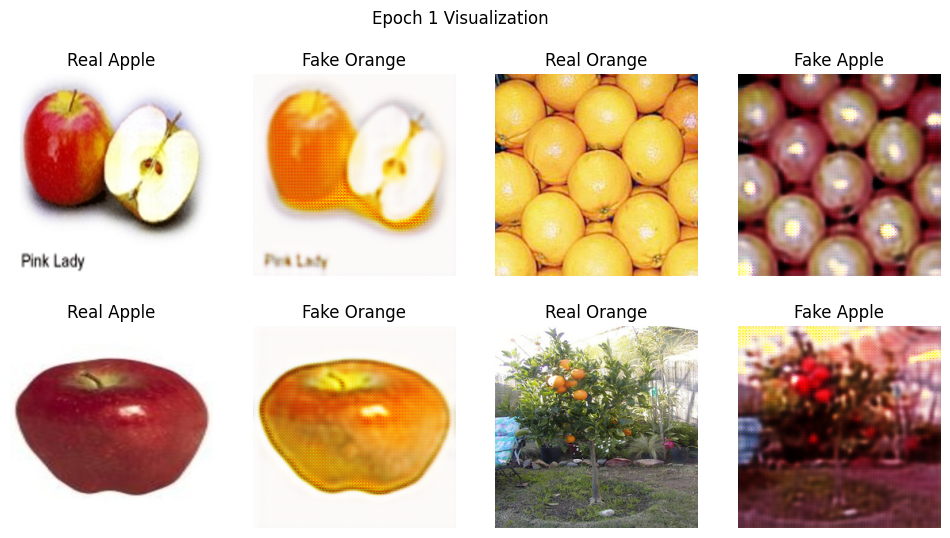

Epoch 2: G_A: 0.3707 | G_B: 0.3792 | D_A: 0.2571 | D_B: 0.2615 | Cycle: 2.1566


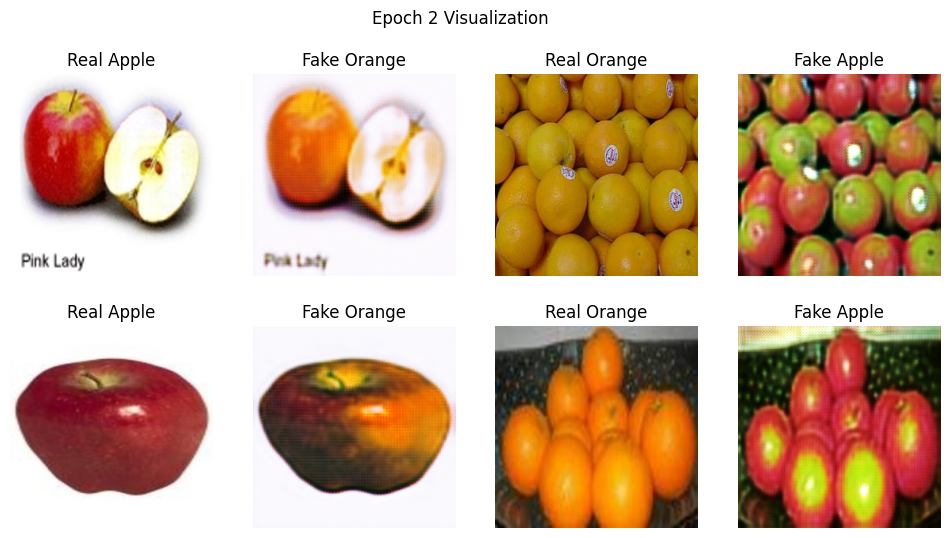

Epoch 3: G_A: 0.3696 | G_B: 0.3843 | D_A: 0.2571 | D_B: 0.2513 | Cycle: 1.9282


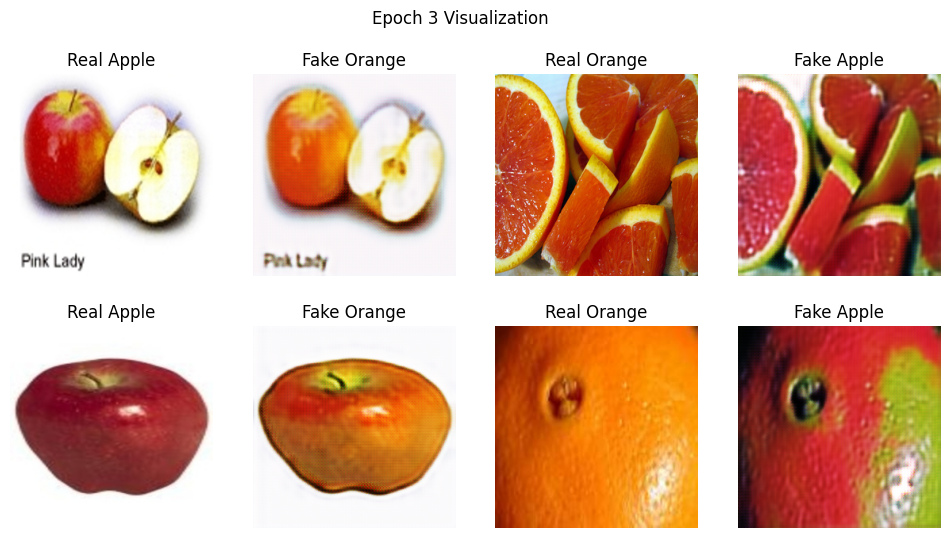

Epoch 4: G_A: 0.3779 | G_B: 0.3936 | D_A: 0.2411 | D_B: 0.2525 | Cycle: 1.8378


Epoch 5: G_A: 0.3723 | G_B: 0.3900 | D_A: 0.2432 | D_B: 0.2499 | Cycle: 1.7313


Epoch 6: G_A: 0.4008 | G_B: 0.3948 | D_A: 0.2359 | D_B: 0.2427 | Cycle: 1.6333


Epoch 7: G_A: 0.3806 | G_B: 0.3812 | D_A: 0.2404 | D_B: 0.2410 | Cycle: 1.6290


Epoch 8: G_A: 0.3869 | G_B: 0.3757 | D_A: 0.2375 | D_B: 0.2363 | Cycle: 1.5981


Epoch 9: G_A: 0.3836 | G_B: 0.3850 | D_A: 0.2377 | D_B: 0.2410 | Cycle: 1.5258


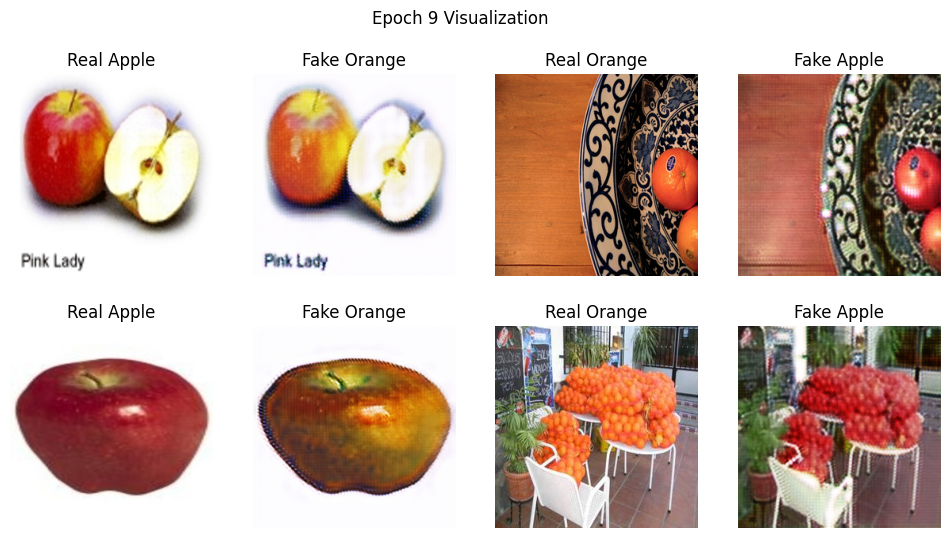

Epoch 10: G_A: 0.3931 | G_B: 0.3732 | D_A: 0.2459 | D_B: 0.2348 | Cycle: 1.4817


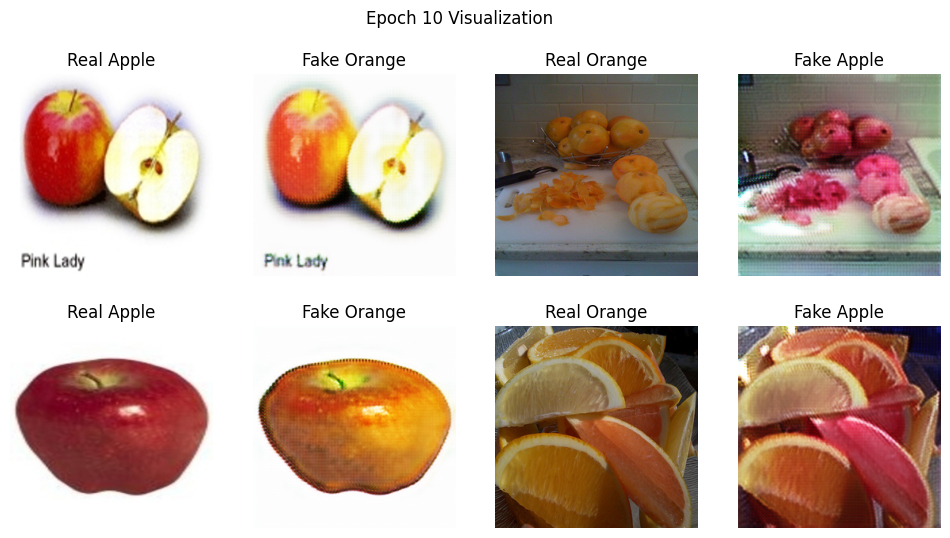

Epoch 11: G_A: 0.3983 | G_B: 0.3773 | D_A: 0.2393 | D_B: 0.2326 | Cycle: 1.4657


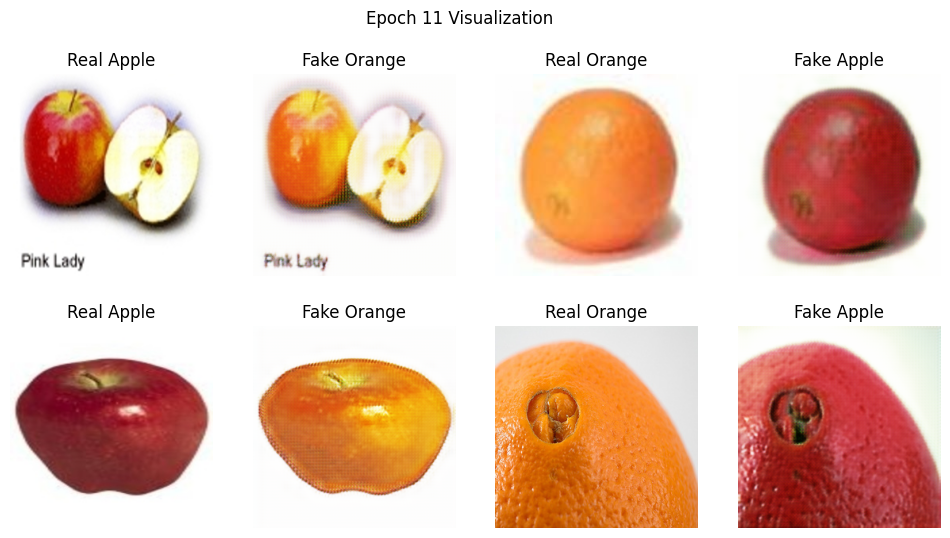

Epoch 12: G_A: 0.4082 | G_B: 0.3804 | D_A: 0.2382 | D_B: 0.2341 | Cycle: 1.4297


Epoch 13: G_A: 0.4152 | G_B: 0.3765 | D_A: 0.2350 | D_B: 0.2262 | Cycle: 1.3836


Epoch 14: G_A: 0.4031 | G_B: 0.3792 | D_A: 0.2327 | D_B: 0.2277 | Cycle: 1.3619


Epoch 15: G_A: 0.4089 | G_B: 0.3936 | D_A: 0.2342 | D_B: 0.2220 | Cycle: 1.3655


Epoch 16: G_A: 0.4150 | G_B: 0.3802 | D_A: 0.2382 | D_B: 0.2214 | Cycle: 1.3364


Epoch 17: G_A: 0.4203 | G_B: 0.3920 | D_A: 0.2300 | D_B: 0.2214 | Cycle: 1.3017


Epoch 18: G_A: 0.4165 | G_B: 0.3845 | D_A: 0.2296 | D_B: 0.2217 | Cycle: 1.2857


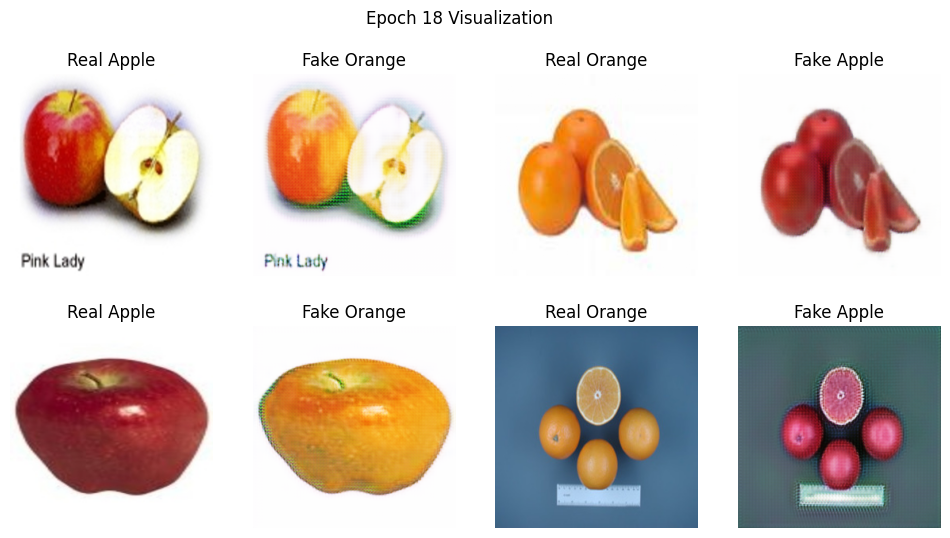

Epoch 19: G_A: 0.4242 | G_B: 0.3906 | D_A: 0.2315 | D_B: 0.2195 | Cycle: 1.2639


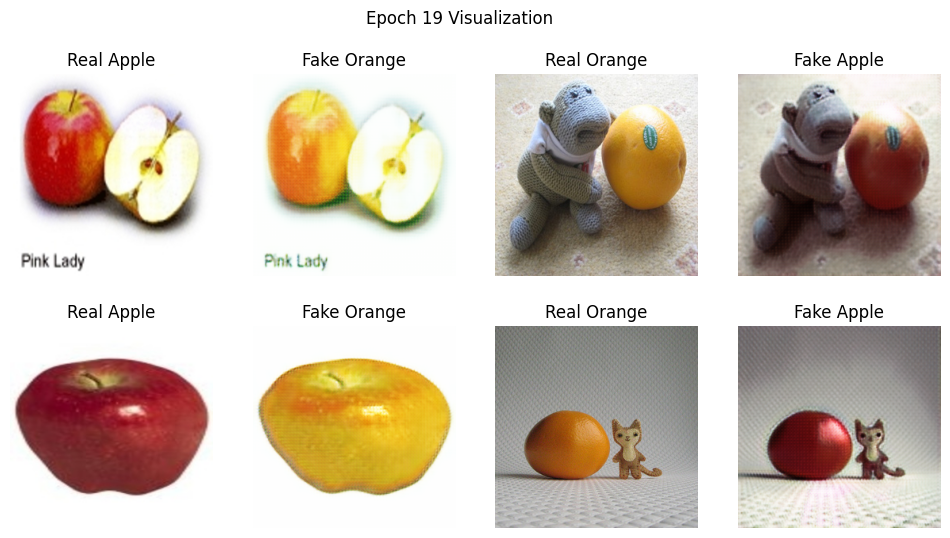

Epoch 20: G_A: 0.4228 | G_B: 0.3972 | D_A: 0.2291 | D_B: 0.2140 | Cycle: 1.2535


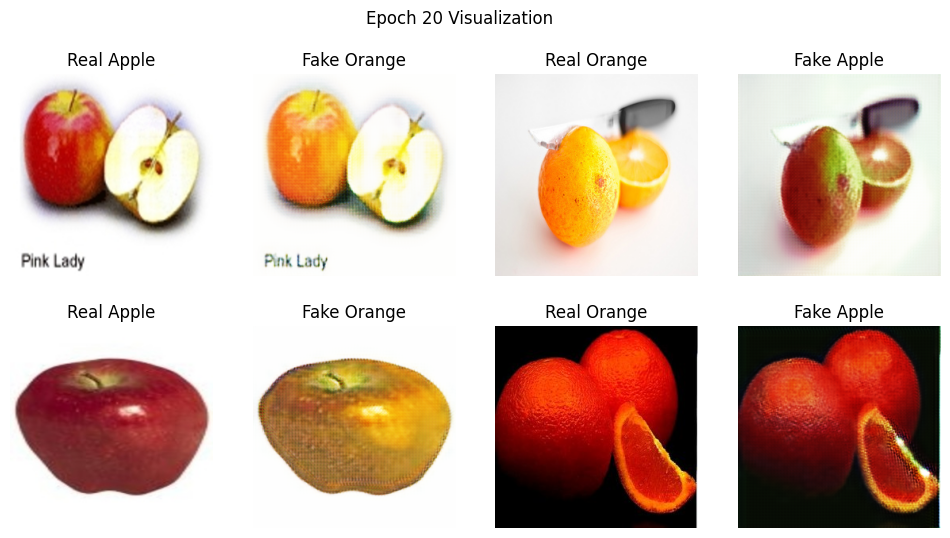

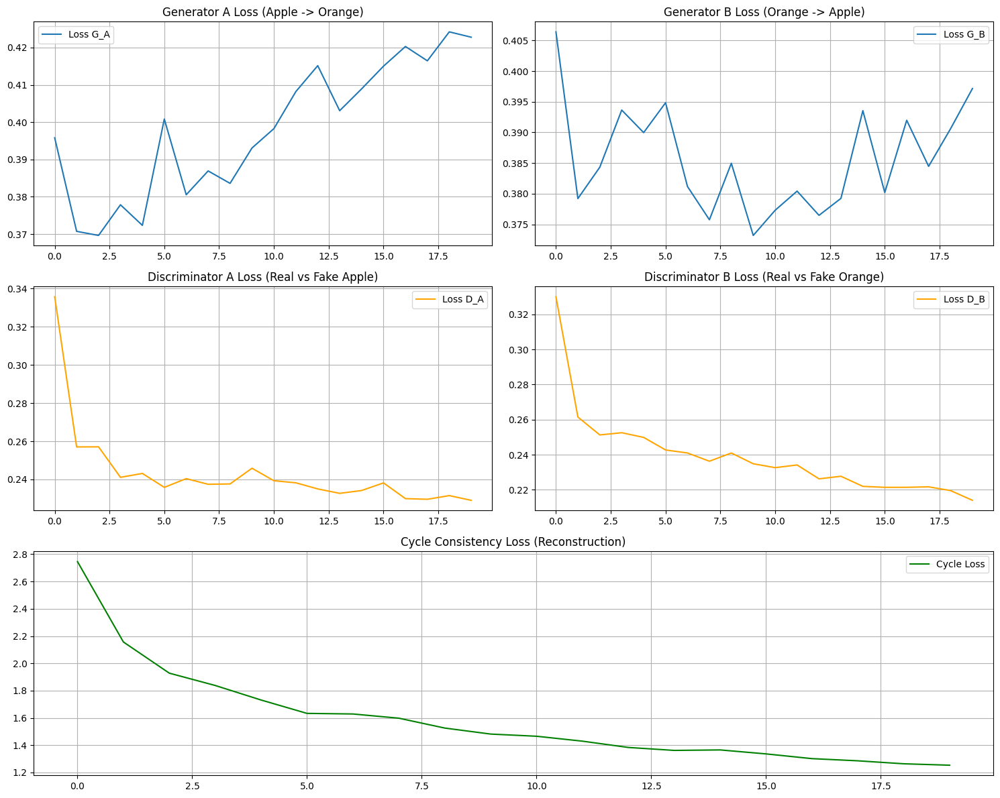

In [6]:
import torch
import itertools
import random
import numpy as np
import matplotlib.pyplot as plt
from torch.autograd import Variable
from torch.utils.data import DataLoader
from tqdm import tqdm
import gc

from torch.amp import autocast, GradScaler 

gc.collect()
torch.cuda.empty_cache()

class ReplayBuffer:
    def __init__(self, max_size=50):
        self.max_size = max_size
        self.data = []

    def push_and_pop(self, data):
        to_return = []
        for element in data.data:
            element = torch.unsqueeze(element, 0)
            if len(self.data) < self.max_size:
                self.data.append(element)
                to_return.append(element)
            else:
                if random.uniform(0, 1) > 0.5:
                    i = random.randint(0, self.max_size - 1)
                    to_return.append(self.data[i].clone())
                    self.data[i] = element
                else:
                    to_return.append(element)
        return torch.cat(to_return)

def weights_init_normal(m):
    classname = m.__class__.__name__
    if 'Conv' in classname:
        if m.weight is not None:
            torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
        if hasattr(m, 'bias') and m.bias is not None:
            torch.nn.init.constant_(m.bias.data, 0.0)
    elif 'BatchNorm2d' in classname or 'InstanceNorm2d' in classname:
        if m.weight is not None:
            torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        if m.bias is not None:
            torch.nn.init.constant_(m.bias.data, 0.0)

EPOCHS = 20
BATCH_SIZE =1        
LR = 0.0002           
B1 = 0.5              
B2 = 0.999
LAMBDA_CYC = 10.0     
LAMBDA_ID = 5.0       
HEIGHT, WIDTH = 128, 128

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device set to: {DEVICE}")


train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=5, shuffle=False, num_workers=1)

G_AB = Generator((3, HEIGHT, WIDTH)).to(DEVICE)
G_BA = Generator((3, HEIGHT, WIDTH)).to(DEVICE)
D_A = Discriminator((3, HEIGHT, WIDTH)).to(DEVICE)
D_B = Discriminator((3, HEIGHT, WIDTH)).to(DEVICE)

G_AB.apply(weights_init_normal)
G_BA.apply(weights_init_normal)
D_A.apply(weights_init_normal)
D_B.apply(weights_init_normal)

optimizer_G = torch.optim.Adam(
    itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=LR, betas=(B1, B2)
)
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=LR, betas=(B1, B2))
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=LR, betas=(B1, B2))

criterion_GAN = torch.nn.MSELoss()
criterion_cycle = torch.nn.L1Loss()
criterion_identity = torch.nn.L1Loss()

fake_A_buffer = ReplayBuffer()
fake_B_buffer = ReplayBuffer()

scaler = GradScaler('cuda')

loss_history = {'G_A': [], 'G_B': [], 'D_A': [], 'D_B': [], 'cycle': []}

def sample_images(epoch):
    batch = next(iter(test_loader))
    real_A = batch['A'].to(DEVICE) 
    real_B = batch['B'].to(DEVICE) 
    
    G_AB.eval()
    G_BA.eval()
    
    with torch.no_grad():
        fake_B = G_AB(real_A[:2]) 
        fake_A = G_BA(real_B[:2]) 
    

    def to_img(t): 
        img = t.cpu().detach().permute(1, 2, 0).numpy() * 0.5 + 0.5
        return np.clip(img, 0, 1) 
    
    fig, axs = plt.subplots(2, 4, figsize=(12, 6))
    

    titles = ['Real Apple', 'Fake Orange', 'Real Orange', 'Fake Apple']
    
    for i in range(2):
        axs[i, 0].imshow(to_img(real_A[i])); axs[i, 0].set_title(titles[0]); axs[i, 0].axis('off')
        axs[i, 1].imshow(to_img(fake_B[i])); axs[i, 1].set_title(titles[1]); axs[i, 1].axis('off')
        
        axs[i, 2].imshow(to_img(real_B[i])); axs[i, 2].set_title(titles[2]); axs[i, 2].axis('off')
        axs[i, 3].imshow(to_img(fake_A[i])); axs[i, 3].set_title(titles[3]); axs[i, 3].axis('off')
        
    plt.suptitle(f"Epoch {epoch} Visualization")
    plt.show()
    
    G_AB.train()
    G_BA.train()

print(f"Starting Training for {EPOCHS} Epochs...")

for epoch in range(1, EPOCHS + 1):
    
    epoch_losses = {'G_A': 0, 'G_B': 0, 'D_A': 0, 'D_B': 0, 'cycle': 0}
    num_batches = len(train_loader)
    
    loop = tqdm(train_loader, desc=f"Epoch {epoch}", leave=False)
    
    for i, batch in enumerate(loop):
        
        real_A = batch['A'].to(DEVICE)
        real_B = batch['B'].to(DEVICE)
        
        with torch.no_grad():
            dummy_out = D_A(real_A)
            target_real = Variable(torch.ones_like(dummy_out).to(DEVICE), requires_grad=False)
            target_fake = Variable(torch.zeros_like(dummy_out).to(DEVICE), requires_grad=False)


        optimizer_G.zero_grad()

        with autocast('cuda'):
            loss_id_A = criterion_identity(G_BA(real_A), real_A)
            loss_id_B = criterion_identity(G_AB(real_B), real_B)
            loss_identity = (loss_id_A + loss_id_B) / 2 * LAMBDA_ID

            fake_B = G_AB(real_A)
            loss_GAN_AB = criterion_GAN(D_B(fake_B), target_real)
            fake_A = G_BA(real_B)
            loss_GAN_BA = criterion_GAN(D_A(fake_A), target_real)
            loss_GAN = (loss_GAN_AB + loss_GAN_BA) / 2

            recov_A = G_BA(fake_B)
            loss_cycle_A = criterion_cycle(recov_A, real_A)
            recov_B = G_AB(fake_A)
            loss_cycle_B = criterion_cycle(recov_B, real_B)
            loss_cycle = (loss_cycle_A + loss_cycle_B) / 2 * LAMBDA_CYC

            loss_G = loss_GAN + loss_cycle + loss_identity

        scaler.scale(loss_G).backward()
        scaler.step(optimizer_G)


        optimizer_D_A.zero_grad()
        with autocast('cuda'):
            loss_real = criterion_GAN(D_A(real_A), target_real)
            fake_A_ = fake_A_buffer.push_and_pop(fake_A)
            loss_fake = criterion_GAN(D_A(fake_A_.detach()), target_fake)
            loss_D_A = (loss_real + loss_fake) / 2
        scaler.scale(loss_D_A).backward()
        scaler.step(optimizer_D_A)


        optimizer_D_B.zero_grad()
        with autocast('cuda'):
            loss_real = criterion_GAN(D_B(real_B), target_real)
            fake_B_ = fake_B_buffer.push_and_pop(fake_B)
            loss_fake = criterion_GAN(D_B(fake_B_.detach()), target_fake)
            loss_D_B = (loss_real + loss_fake) / 2
        scaler.scale(loss_D_B).backward()
        scaler.step(optimizer_D_B)
        
        scaler.update()
        
        epoch_losses['G_A'] += loss_GAN_AB.item()
        epoch_losses['G_B'] += loss_GAN_BA.item()
        epoch_losses['D_A'] += loss_D_A.item()
        epoch_losses['D_B'] += loss_D_B.item()
        epoch_losses['cycle'] += loss_cycle.item()

    for key in epoch_losses:
        loss_history[key].append(epoch_losses[key] / num_batches)

    print(f"Epoch {epoch}: "
          f"G_A: {loss_history['G_A'][-1]:.4f} | "
          f"G_B: {loss_history['G_B'][-1]:.4f} | "
          f"D_A: {loss_history['D_A'][-1]:.4f} | "
          f"D_B: {loss_history['D_B'][-1]:.4f} | "
          f"Cycle: {loss_history['cycle'][-1]:.4f}")

    if epoch <= 3 or 9 <= epoch <= 11 or epoch >= 18:
        sample_images(epoch)

plt.figure(figsize=(15, 12)) 

# Row 1: Generators
plt.subplot(3, 2, 1)
plt.plot(loss_history['G_A'], label='Loss G_A')
plt.title("Generator A Loss (Apple -> Orange)")
plt.legend()
plt.grid(True)

plt.subplot(3, 2, 2)
plt.plot(loss_history['G_B'], label='Loss G_B')
plt.title("Generator B Loss (Orange -> Apple)")
plt.legend()
plt.grid(True)

# Row 2: Discriminators
plt.subplot(3, 2, 3)
plt.plot(loss_history['D_A'], label='Loss D_A', color='orange')
plt.title("Discriminator A Loss (Real vs Fake Apple)")
plt.legend()
plt.grid(True)

plt.subplot(3, 2, 4)
plt.plot(loss_history['D_B'], label='Loss D_B', color='orange')
plt.title("Discriminator B Loss (Real vs Fake Orange)")
plt.legend()
plt.grid(True)

# Row 3: Cycle Loss (Full Width)
plt.subplot(3, 1, 3)
plt.plot(loss_history['cycle'], label='Cycle Loss', color='green')
plt.title("Cycle Consistency Loss (Reconstruction)")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()